In [21]:
! pip install opencv-python
! pip install ftfy regex tqdm
! pip install streamlit
! pip install torchray

In [22]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0"
import torch
from model import build_model
from clip_ import load, tokenize
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt
import streamlit as st
from torchray.attribution.grad_cam import grad_cam
from matplotlib import rc
import os
import torchvision.models as models
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
import matplotlib

In [23]:
torch.cuda.is_available()

True

In [24]:
def show_cam_on_image(img, mask, neg_saliency=False):
    if neg_saliency:
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_RAINBOW)
    else:
        heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam

def show_overlapped_cam(img, neg_mask, pos_mask):
    neg_heatmap = cv2.applyColorMap(np.uint8(255 * neg_mask), cv2.COLORMAP_RAINBOW)
    pos_heatmap = cv2.applyColorMap(np.uint8(255 * pos_mask), cv2.COLORMAP_JET)
    neg_heatmap = np.float32(neg_heatmap) / 255
    pos_heatmap = np.float32(pos_heatmap) / 255
    # try different options: sum, average, ...
    heatmap = neg_heatmap + pos_heatmap
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return cam

In [25]:
def vit_relevance(image1, image2, model, device, neg_saliency=False, index=None):
    
    image2_features = model.encode_image(image2)
    image1_features = model.encode_image(image1)

    image1_features_norm = image1_features.norm(dim=-1, keepdim=True)
    image1_features_new = image1_features / image1_features_norm
    image2_features_norm = image2_features.norm(dim=-1, keepdim=True)
    image2_features_new = image2_features / image2_features_norm
    
    similarity = image1_features_new[0].dot(image2_features_new[0])
    
    if neg_saliency:
        objective = 1-similarity
    else:
        objective = similarity
        
 
    #model.zero_grad()
    model.visual.eval()
    model.visual.zero_grad()
    objective.backward(retain_graph=True)
    
    image_attn_blocks = list(dict(model.visual.transformer.resblocks.named_children()).values())
    num_tokens = image_attn_blocks[0].attn_probs.shape[-1]
    R = torch.eye(num_tokens, num_tokens, dtype=image_attn_blocks[0].attn_probs.dtype).to(device)
    for blk in image_attn_blocks:
        grad = blk.attn_grad
        cam = blk.attn_probs
        cam = cam.reshape(-1, cam.shape[-1], cam.shape[-1])
        grad = grad.reshape(-1, grad.shape[-1], grad.shape[-1])
        cam = grad * cam
        cam = cam.clamp(min=0).mean(dim=0)
        R += torch.matmul(cam, R)
    R[0, 0] = 0
    image_relevance = R[0, 1:]

    image_relevance = image_relevance.reshape(1, 1, 7, 7)
    image_relevance = torch.nn.functional.interpolate(image_relevance, size=224, mode='bilinear')
    image_relevance = image_relevance.reshape(224, 224).cuda().data.cpu().numpy()
    image_relevance = (image_relevance - image_relevance.min()) / (image_relevance.max() - image_relevance.min())
    image1 = image1[0].permute(1, 2, 0).data.cpu().numpy()
    image1 = (image1 - image1.min()) / (image1.max() - image1.min())
    
    return image_relevance, image1


In [26]:
def interpret_vit(image1, image2, model, device, neg_saliency=False, index=None):
    
    image_relevance, image1 = vit_relevance(image1, image2, model, device, neg_saliency=neg_saliency, index=index)
    vis = show_cam_on_image(image1, image_relevance, neg_saliency=neg_saliency)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

def interpret_vit_overlapped(image1, image2, model, device, index=None):
    
    pos_image_relevance, image = vit_relevance(image1, image2, model, device, neg_saliency=False, index=index)
    neg_image_relevance, image = vit_relevance(image1, image2, model, device, neg_saliency=True, index=index)

    vis = show_overlapped_cam(image, neg_image_relevance, pos_image_relevance)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

2021-11-19 21:47:52.840 
  command:

    streamlit run /home/mamooler/miniconda/envs/habitat/lib/python3.7/site-packages/ipykernel_launcher.py [ARGUMENTS]


In [27]:
def rn_relevance(image1, image2, model, device, neg_saliency=False, index=None):
 
    image2_features = model(image2)
    image1_features = model(image1)
    
    
    image1_features_norm = image1_features.norm(dim=-1, keepdim=True)
    image1_features_new = image1_features / image1_features_norm
    image2_features_norm = image2_features.norm(dim=-1, keepdim=True)
    image2_features_new = image2_features / image2_features_norm


    if neg_saliency:
        objective = -image2_features_new
    else:
        objective = image2_features_new
        
    objective = (objective * image1_features_norm)
    image_relevance = grad_cam(model, image1, objective, saliency_layer=layer)
        
    image_relevance = image_relevance.reshape(1, 1, 7, 7)
    image_relevance = torch.nn.functional.interpolate(image_relevance, size=224, mode='bilinear')
    image_relevance = image_relevance.reshape(224, 224).cuda().data.cpu().numpy()
    image_relevance = (image_relevance - image_relevance.min()) / (image_relevance.max() - image_relevance.min())
    image1 = image1[0].permute(1, 2, 0).data.cpu().numpy()
    image1 = (image1 - image1.min()) / (image1.max() - image1.min())
   
    return image_relevance, image1

In [28]:
def interpret_rn(image1, image2, model, device, neg_saliency=False, index=None):   
   
    image_relevance, image1 = rn_relevance(image1, image2, model, device, neg_saliency=neg_saliency, index=index)
    vis = show_cam_on_image(image1, image_relevance, neg_saliency=neg_saliency)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)
    
def interpret_rn_overlapped(image1, image2, model, device, index=None):   
   
    pos_image_relevance, image = rn_relevance(image1, image2, model, device, neg_saliency=False, index=index)
    neg_image_relevance, image = rn_relevance(image1, image2, model, device, neg_saliency=True, index=index)

    vis = show_overlapped_cam(image, neg_image_relevance, pos_image_relevance)
    vis = np.uint8(255 * vis)
    vis = cv2.cvtColor(np.array(vis), cv2.COLOR_RGB2BGR)

    plt.imshow(vis)

In [29]:
device = "cuda" if torch.cuda.is_available() else "cpu"

st.sidebar.header('Options')
alpha = st.sidebar.radio("select alpha", [0.5, 0.7, 0.8], index=1)
layer = st.sidebar.selectbox("select saliency layer", ['layer4.2.relu'], index=0)

model, preprocess = load("ViT-B/32", device=device, jit=False)
model_rn, preprocess = load("RN50", device=device, jit=False)
resnet50 = models.resnet50(pretrained=True)
resnet50.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [30]:
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'

In [31]:
def sim_score(model, image1, image2):
    
    image1_features = model.encode_image(image1)
    image2_features = model.encode_image(image2)
    
    image1_features_norm = image1_features.norm(dim=-1, keepdim=True)
    image1_features_new = image1_features / image1_features_norm
    image2_features_norm = image2_features.norm(dim=-1, keepdim=True)
    image2_features_new = image2_features / image2_features_norm
    
    similarity = image1_features_new[0].dot(image2_features_new[0])

    return similarity

In [32]:
root = "/scratch/students/2021-fall-sp-mamooler/Ringier_Project/Images/"

img1_ids = ["horse&dog.jpg", "horse&sheep.jpg", "cow&sheep.jpg", "vase_or_face.png", "duck-rabbit.jpeg"]

img2_ids = [["horse.jpg", "dog.jpg", "horse_sketch.jpg", "dog_sketch.jpg"], 
            ["horse.jpg", "sheep.jpg", "horse_comic.jpg", "sheep_comic.jpg"], 
            ["cow.jpg", "sheep.jpg", "cow_comic.jpg", "sheep_comic.jpg"], 
            ["vase.jpg", "two_faces.jpg"],
            ["duck.jpg", "rabbit.jpg"]]

model_types = ["ViT", "RN50", "ResNet50"]

font = {
    'size': 15,
}

ori_preprocess = Compose([
    Resize((224), interpolation=Image.BICUBIC),
    CenterCrop(size=(224, 224)),
    ToTensor()])
print(preprocess)

Compose(
    Resize(size=224, interpolation=PIL.Image.BICUBIC)
    CenterCrop(size=(224, 224))
    <function _transform.<locals>.<lambda> at 0x7fc5ffe1a680>
    ToTensor()
    Normalize(mean=(0.48145466, 0.4578275, 0.40821073), std=(0.26862954, 0.26130258, 0.27577711))
)


/home/mamooler/miniconda/envs/habitat/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/home/mamooler/miniconda/envs/habitat/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


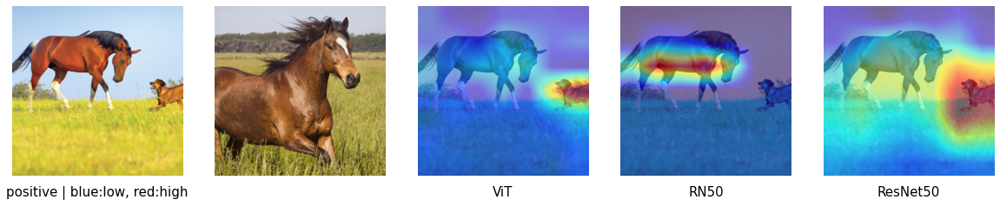

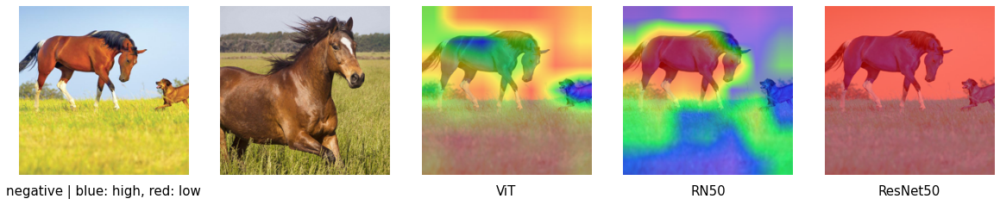

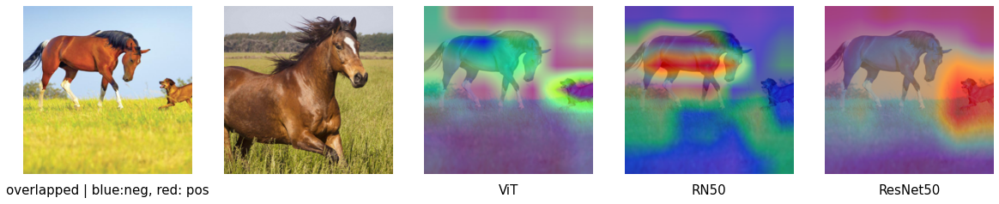

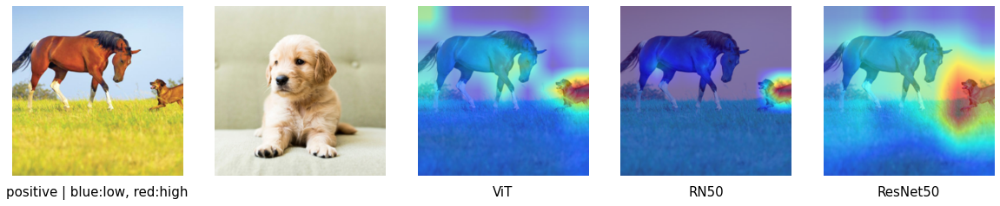

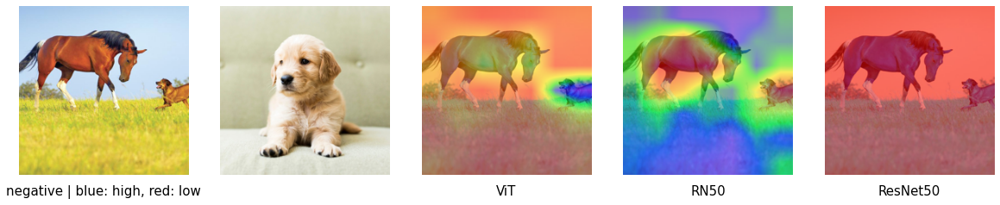

...

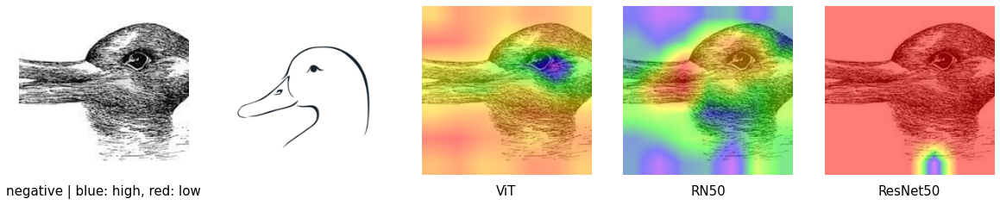

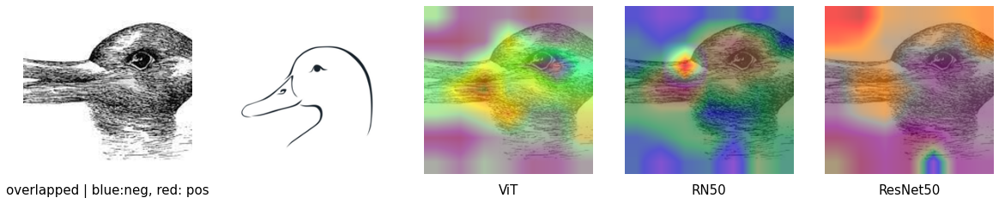

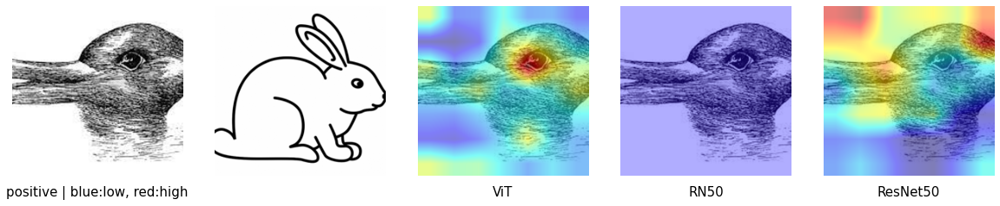

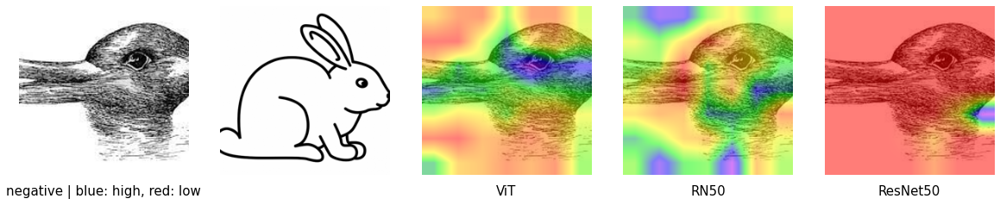

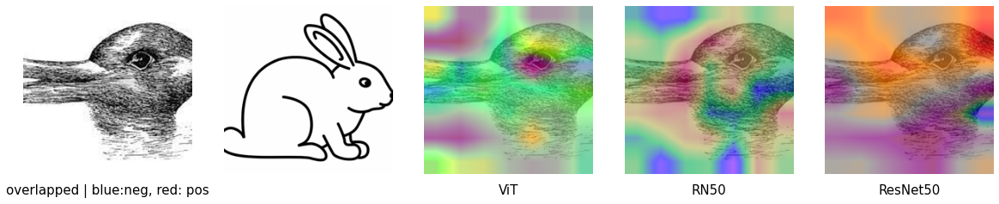

In [33]:
matplotlib.rcParams['mathtext.fontset'] = 'custom'
matplotlib.rcParams['mathtext.rm'] = 'Bitstream Vera Sans'
matplotlib.rcParams['mathtext.it'] = 'Bitstream Vera Sans:italic'
matplotlib.rcParams['mathtext.bf'] = 'Bitstream Vera Sans:bold'
# matplotlib.rcParams['mathtext.size'] = 16

#fig, ax = plt.subplots(len(2*img_ids), 3, figsize=(16,16))

for id_, img_id in enumerate(img1_ids):
    
    for i,img2_id in enumerate(img2_ids[id_]):

           for neg in [False, True, None]:
            
                img_path =  os.path.join(root, img_id )
                image = ori_preprocess(Image.open(img_path))
                img2_path =  os.path.join(root, img2_id)
                image2 = ori_preprocess(Image.open(img2_path))
                p_image1 = preprocess(Image.open(img_path)).unsqueeze(0).to(device)
                p_image2 = preprocess(Image.open(img2_path)).unsqueeze(0).to(device)

                

                plt.figure(figsize=(16, 16))
                plt.tight_layout()
                plt.subplot(151)
                plt.imshow(image.permute(1, 2, 0))
                plt.axis('off')
                if neg==None: caption = "overlapped | blue:neg, red: pos"
                elif neg==True: caption = "negative | blue: high, red: low"
                else: caption = "positive | blue:low, red:high"
                plt.title(caption, **font, y=-0.15)

                plt.tight_layout()
                plt.subplot(152)
                plt.imshow(image2.permute(1, 2, 0))
                plt.axis('off')
                
               

                for model_id, model_type in enumerate(model_types):
                    
       
                    plt.subplot(153+model_id)
                    if model_type=="ViT":
                        if not neg==None:
                            interpret_vit(model=model, image1=p_image1, image2=p_image2, neg_saliency=neg, device=device, index=0)
                        else:
                            interpret_vit_overlapped(model=model, image1=p_image1, image2=p_image2, device=device, index=0)
                            
                    else:
                        
                        if model_type=="RN50":
                            current_model = model_rn.visual
                        else:
                            current_model = resnet50
                            
                        if not neg==None:
                            interpret_rn(model=current_model, image1=p_image1, image2=p_image2, neg_saliency=neg, device=device, index=0)
                        else:
                            interpret_rn_overlapped(model=current_model, image1=p_image1, image2=p_image2, device=device, index=0)
                            
                

                    plt.title(model_type, **font,y=-0.15)
                    plt.tight_layout()
                    plt.axis('off')


                    dir_path = f'comparison/img_img/'
                    if not os.path.exists(dir_path):
                        os.mkdir(dir_path)
                    plt.savefig(f'{dir_path}{model_type}_{img_id}_vs_{img2_id}', bbox_inches='tight')
